Aqui clasifico la imagen: cow.jpg y establezco el porcentaje de clasificación de cada tipo de pixel.

/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


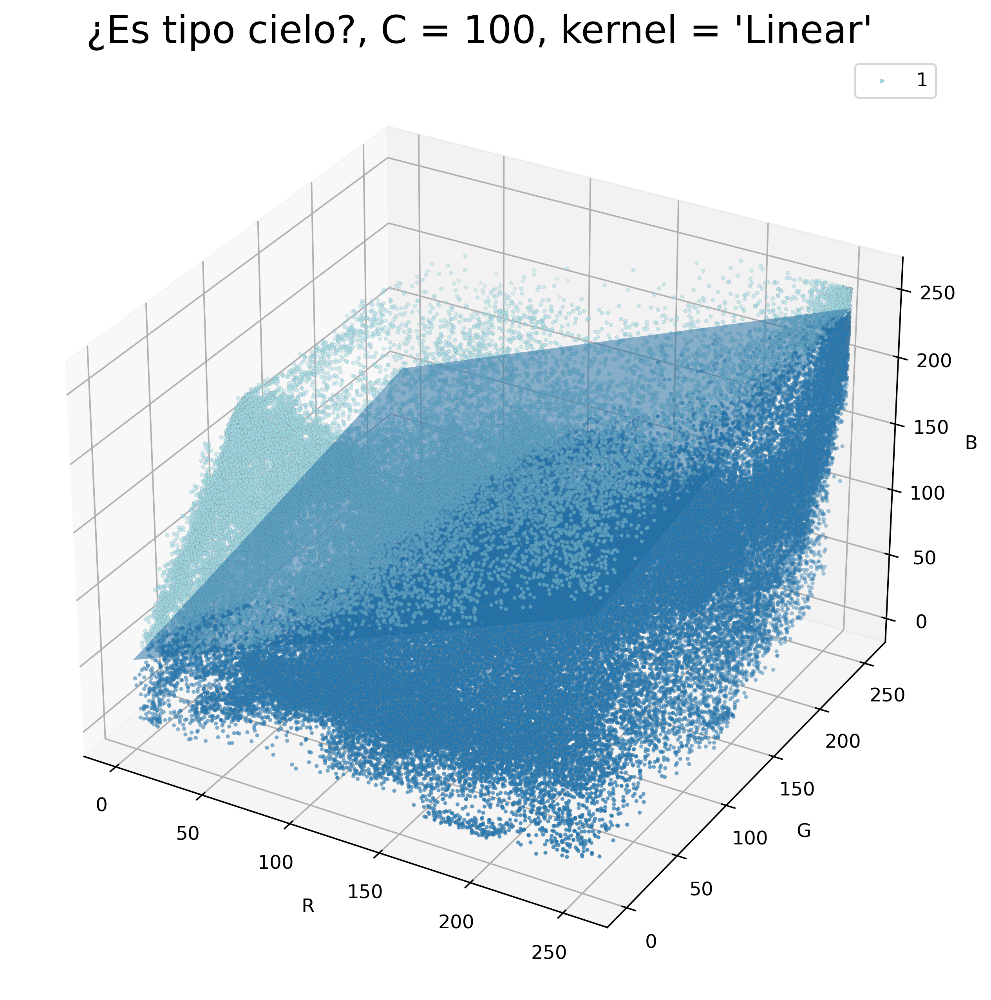

In [33]:
import matplotlib as plt
import numpy as np
import pandas as pd
from scipy import misc
import matplotlib.pyplot as plt
from PIL import Image

from sklearn.svm import SVC, LinearSVC
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score

cielo = Image.open('cielo.jpg')
cieloA = np.array(cielo)
cieloM = np.reshape(cieloA,(-1,3))

pasto = Image.open('pasto.jpg')
pastoA = np.array(pasto)
pastoM = np.reshape(pastoA,(-1,3))

vaca = Image.open('vaca.jpg')
vacaA = np.array(vaca)
vacaM = np.reshape(vacaA,(-1,3))

cieloDF = pd.DataFrame(cieloM,columns=list('rgb'))
pastoDF = pd.DataFrame(pastoM,columns=list('rgb'))
vacaDF = pd.DataFrame(vacaM,columns=list('rgb'))

#carga de la imagen a clasificar
cow = Image.open('ww.jpg')
cowA = np.array(cow)
cowM = np.reshape(cowA,(-1,3))
cowDF = pd.DataFrame(cowM,columns=list('rgb'))

# ==============================================================================
#CLASIFICADOR CIELO
cieloDF = cieloDF.assign(Tipo=1)
pastoDF = pastoDF.assign(Tipo=-1)
vacaDF = vacaDF.assign(Tipo=-1)
dataset = cieloDF.append(pastoDF,ignore_index=True)
dataset = dataset.append(vacaDF,ignore_index=True)

# Preprocesado y modelado 
color = dataset.drop(columns = 'Tipo')
tipo = dataset['Tipo']

color_train, color_test, tipo_train, tipo_test = train_test_split(
                                        color,
                                        tipo,
                                        train_size   = 0.7,
                                        random_state = 1234,
                                        shuffle      = True
                                    )
# Creación del modelo SVM lineal 
model = LinearSVC(C = 100 , random_state=123, max_iter=200000)
modelo1 = model.fit(color_train, tipo_train)

# Predicción valores grid
predicciones1 = modelo1.predict(cowDF)

# Creamos la figura
fig1 = plt.figure(figsize=(9,9),dpi=350)
ax1 = fig1.add_subplot( 111, projection='3d')

x = cowDF.r
y = cowDF.g
z = cowDF.b
ax1.scatter3D(x, y, z,
              c=predicciones1, marker='o',
              depthshade=True, s=4,
              cmap=plt.cm.tab20,
              edgecolors='gray',
              linewidth=0.1,)

ax1.set_title("¿Es tipo cielo?, C = 100, kernel = 'Linear'", fontsize=20)
ax1.set_xlabel('R')
ax1.set_ylabel('G')
ax1.set_zlabel('B')
ax1.legend(predicciones1)

#Hiperplano
z = lambda x,y: (-modelo1.intercept_[0]-modelo1.coef_[0][0]*x -modelo1.coef_[0][1]*y) / modelo1.coef_[0][2]
tmp = np.linspace(0,255,25)
x,y = np.meshgrid(tmp,tmp)
ax1.plot_surface(x, y, z(x,y),alpha=0.5)


plt.show()





In [36]:
import collections
clasif1 = collections.Counter(predicciones1)
#print(clasif1)
#print(np.count_nonzero(predicciones1 == 1))
clasif_cielo = (clasif1[1]/(clasif1[1]+clasif1[-1]))*100
print('Porcentaje de pixeles clasificados como "cielo": ',clasif_cielo ,'%')

Porcentaje de pixeles clasificados como "cielo":  28.596441947565545 %


/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


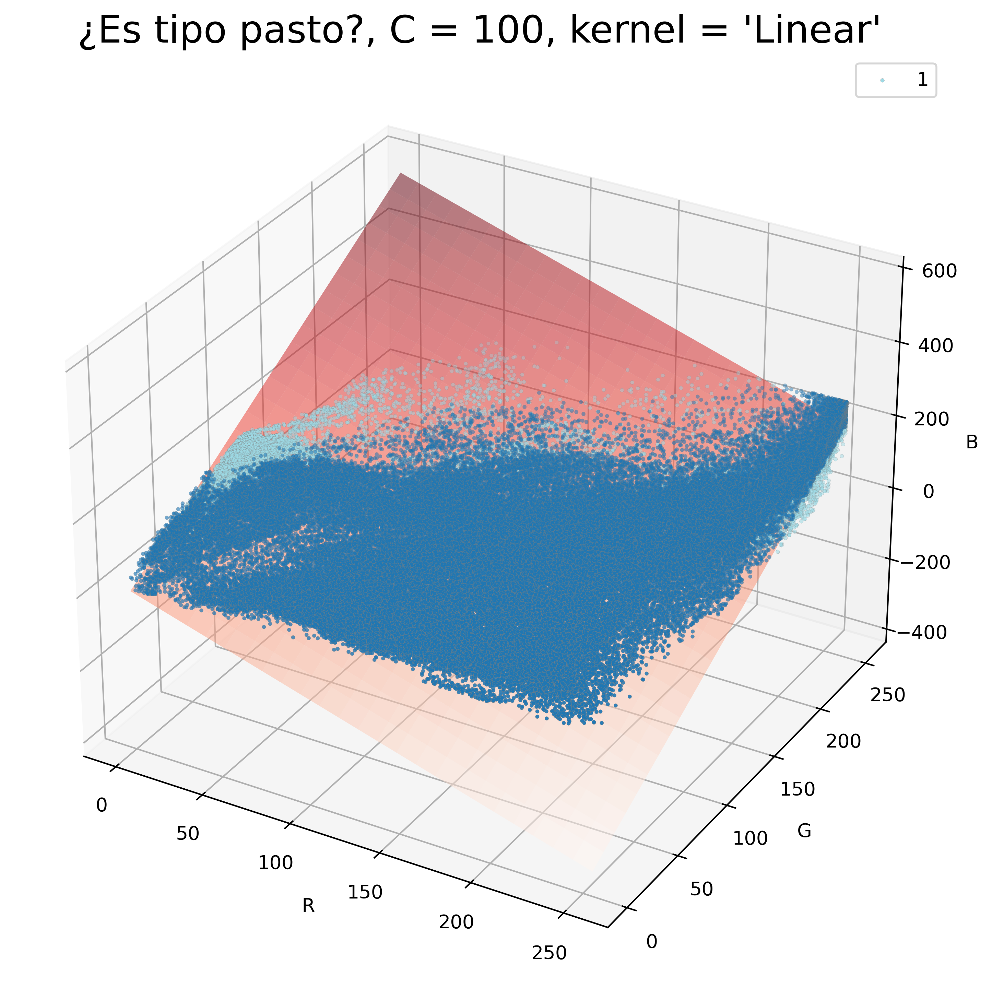

In [9]:
import matplotlib as plt
import numpy as np
import pandas as pd
from scipy import misc
import matplotlib.pyplot as plt
from PIL import Image

from sklearn.svm import SVC, LinearSVC
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score

cielo = Image.open('cielo.jpg')
cieloA = np.array(cielo)
cieloM = np.reshape(cieloA,(-1,3))

pasto = Image.open('pasto.jpg')
pastoA = np.array(pasto)
pastoM = np.reshape(pastoA,(-1,3))

vaca = Image.open('vaca.jpg')
vacaA = np.array(vaca)
vacaM = np.reshape(vacaA,(-1,3))

cieloDF = pd.DataFrame(cieloM,columns=list('rgb'))
pastoDF = pd.DataFrame(pastoM,columns=list('rgb'))
vacaDF = pd.DataFrame(vacaM,columns=list('rgb'))

#carga de la imagen a clasificar
cow = Image.open('ww.jpg')
cowA = np.array(cow)
cowM = np.reshape(cowA,(-1,3))
cowDF = pd.DataFrame(cowM,columns=list('rgb'))

# ==============================================================================
#CLASIFICADOR PASTO
cieloDF = cieloDF.assign(Tipo=-1)
pastoDF = pastoDF.assign(Tipo=1)
vacaDF = vacaDF.assign(Tipo=-1)
dataset = cieloDF.append(pastoDF,ignore_index=True)
dataset = dataset.append(vacaDF,ignore_index=True)

# Preprocesado y modelado 
color = dataset.drop(columns = 'Tipo')
tipo = dataset['Tipo']

color_train, color_test, tipo_train, tipo_test = train_test_split(
                                        color,
                                        tipo,
                                        train_size   = 0.7,
                                        random_state = 1234,
                                        shuffle      = True
                                    )
# Creación del modelo SVM lineal 
model2 = LinearSVC(C = 100 , random_state=123, max_iter=200000)
modelo2 = model2.fit(color_train, tipo_train)

# Predicción valores grid
predicciones2 = modelo2.predict(cowDF)

# Creamos la figura
fig2 = plt.figure(figsize=(9,9),dpi=400)
ax2 = fig2.add_subplot( 111, projection='3d')

x = cowDF.r
y = cowDF.g
z = cowDF.b
ax2.scatter3D(x, y, z,
              c=predicciones2, marker='o',
              depthshade=True, s=4,
              cmap=plt.cm.tab20,
              edgecolors='gray',
              linewidth=0.1,)

ax2.set_title("¿Es tipo pasto?, C = 100, kernel = 'Linear'", fontsize=20)
ax2.set_xlabel('R')
ax2.set_ylabel('G')
ax2.set_zlabel('B')
ax2.legend(predicciones2)

#Hiperplano
z = lambda x,y: (-modelo2.intercept_[0]-modelo2.coef_[0][0]*x -modelo2.coef_[0][1]*y) / modelo2.coef_[0][2]
tmp = np.linspace(0,255,25)
x,y = np.meshgrid(tmp,tmp)
ax2.plot_surface(x, y, z(x,y),alpha=0.5,cmap='Reds')

plt.show()


In [12]:
import collections
clasif2 = collections.Counter(predicciones2)
#print(np.count_nonzero(predicciones1 == 1))
clasif_pasto = (clasif2[1]/(clasif2[-1]+clasif2[1]))*100
print('Porcentaje de pixeles clasificados como "pasto": ',clasif_pasto ,'%')

Porcentaje de pixeles clasificados como "pasto":  12.502808988764045 %


/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


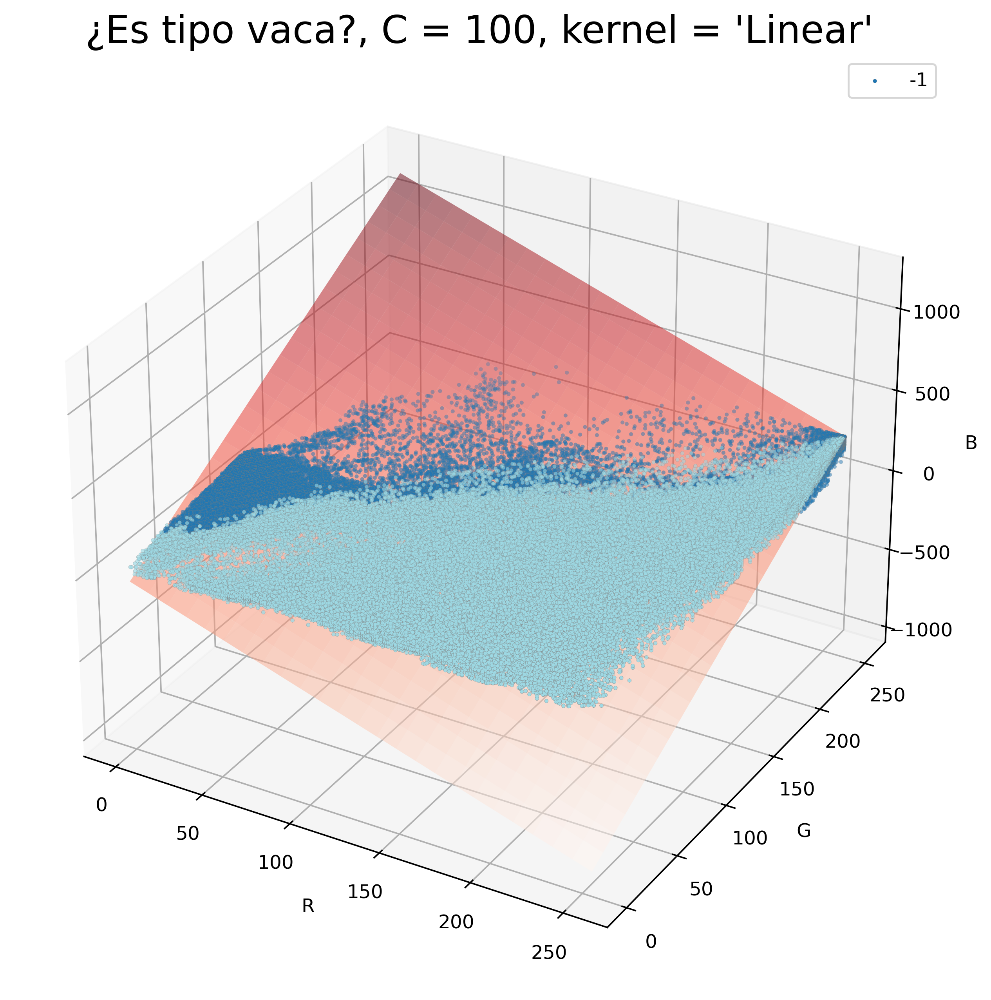

In [11]:
import matplotlib as plt
import numpy as np
import pandas as pd
from scipy import misc
import matplotlib.pyplot as plt
from PIL import Image

from sklearn.svm import SVC, LinearSVC
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score

cielo = Image.open('cielo.jpg')
cieloA = np.array(cielo)
cieloM = np.reshape(cieloA,(-1,3))

pasto = Image.open('pasto.jpg')
pastoA = np.array(pasto)
pastoM = np.reshape(pastoA,(-1,3))

vaca = Image.open('vaca.jpg')
vacaA = np.array(vaca)
vacaM = np.reshape(vacaA,(-1,3))

cieloDF = pd.DataFrame(cieloM,columns=list('rgb'))
pastoDF = pd.DataFrame(pastoM,columns=list('rgb'))
vacaDF = pd.DataFrame(vacaM,columns=list('rgb'))

#carga de la imagen a clasificar
cow = Image.open('ww.jpg')
cowA = np.array(cow)
cowM = np.reshape(cowA,(-1,3))
cowDF = pd.DataFrame(cowM,columns=list('rgb'))

# ==============================================================================
#CLASIFICADOR VACA
cieloDF = cieloDF.assign(Tipo=-1)
pastoDF = pastoDF.assign(Tipo=-1)
vacaDF = vacaDF.assign(Tipo=1)
dataset = cieloDF.append(pastoDF,ignore_index=True)
dataset = dataset.append(vacaDF,ignore_index=True)

# Preprocesado y modelado 
color = dataset.drop(columns = 'Tipo')
tipo = dataset['Tipo']

color_train, color_test, tipo_train, tipo_test = train_test_split(
                                        color,
                                        tipo,
                                        train_size   = 0.7,
                                        random_state = 1234,
                                        shuffle      = True
                                    )
# Creación del modelo SVM lineal 
model3 =LinearSVC(C = 100, random_state=123, max_iter=200000)
modelo3 = model3.fit(color_train, tipo_train)

# Predicción valores grid
predicciones3 = modelo3.predict(cowDF)

# Creamos la figura
fig3 = plt.figure(figsize=(9,9),dpi=350)
ax3 = fig3.add_subplot( 111, projection='3d')

x = cowDF.r
y = cowDF.g
z = cowDF.b
ax3.scatter3D(x, y, z,
              c=predicciones3, marker='o',
              depthshade=True, s=4,
              cmap=plt.cm.tab20,
              edgecolors='gray',
              linewidth=0.1,)

ax3.set_title("¿Es tipo vaca?, C = 100, kernel = 'Linear'", fontsize=20)
ax3.set_xlabel('R')
ax3.set_ylabel('G')
ax3.set_zlabel('B')
ax3.legend(predicciones3)

#Hiperplano
z = lambda x,y: (-modelo3.intercept_[0]-modelo3.coef_[0][0]*x -modelo3.coef_[0][1]*y) / modelo3.coef_[0][2]
tmp = np.linspace(0,255,25)
x,y = np.meshgrid(tmp,tmp)
ax3.plot_surface(x, y, z(x,y),alpha=0.5,cmap='Reds')

plt.show()

In [14]:
import collections
clasif2 = collections.Counter(predicciones3)
#print(np.count_nonzero(predicciones1 == 1))
clasif_vaca = (clasif2[1]/(clasif2[-1]+clasif2[1]))*100
print('Porcentaje de pixeles clasificados como "vaca": ',clasif_vaca ,'%')

Porcentaje de pixeles clasificados como "vaca":  77.14887640449439 %
